<div>
    <img src="img/Logo.png" align="right" width="200"</img>
</div>
<br/> 

# Filtering

In this exercise we want to work with filters to denoise our image and to detect edges in it. 

## 1. Preparation

### 1.1 Method for general Filter Calculation

Write a method, that expects an image as well as a filterkernel and that computes the filtered image as shown below. 
- Keep your method as flexible as possible. 
    - e.g. image size, filter size
- Think about how you want to handle the edges of the image.

<center><img src="./img/FilterProcess.png"></center>

### <center>$f'(x,y)=\sum \limits_{i=-n}^{n}\sum \limits_{j=-m}^{m} f(x+i,y+j) \cdot g(i,j)$</center>

In [179]:
import numpy as np
import cv2
import random
from math import sqrt, exp
from PIL import Image
import matplotlib.pyplot as plt

def filtering(image, filter):
    xDim=image.shape[0]
    yDim=image.shape[1]
    
    filterXdim=filter.shape[0]
    filterYdim=filter.shape[1]
    
    filterXhalfDim=int(filterXdim/2)
    filterYhalfDim=int(filterYdim/2)
    
    result = np.zeros(image.shape, dtype=np.float)
    
    for x in range(filterXhalfDim,xDim-filterXhalfDim):
        for y in range(filterYhalfDim,yDim-filterYhalfDim):
            sum = 0
            for i in range(-filterXhalfDim,filterXhalfDim+1):
                for j in range(-filterYhalfDim,filterYhalfDim+1):
                    sum += image[x+i,y+j] * filter[i+1,j+1]
            result[x,y]=sum
    return result

### 1.2 Method for Median Filter

Write a method that expects an image and a filtersize and computes the **median filtered** image.<br>
The main idea of the median filter is to run through the image pixel by pixel, replacing each pixel with the median of its neighboring pixels. For this, the values must be sorted within the filter. <br>The result depends on the size of the filter. When you apply the filter, use different filter sizes to see a difference. 

In [180]:
def medianFilter(image, filterSize):
    xDim=image.shape[0]
    yDim=image.shape[1]
    
    filterHalfSize=int(filterSize/2)
    
    result = np.zeros(shape=[xDim,yDim], dtype=np.float)
        
    for x in range(filterHalfSize,xDim-filterHalfSize):
        for y in range(filterHalfSize,yDim-filterHalfSize):
            
            filterKernel = np.zeros(filterSize*filterSize, dtype=np.float)
            k=0
            for i in range(-filterHalfSize,filterHalfSize+1):
                for j in range(-filterHalfSize,filterHalfSize+1):
                    filterKernel[k] = image[x+i,y+j]
                    k=k+1
                    
            sortKernel=np.sort(filterKernel)
            result[x,y]=sortKernel[filterHalfSize]
            
    return result

### 1.3 Method for Sigma Filter

Write another method that expects an image and a filtersize and computes the **sigma filtered** image.<br>The filter smoothes an image by taking an average over the neighboring pixels, only including those pixles that have a value not deviating from the current pixel by more than a given range. The range is defined by the standard deviation of the pixel values within the neighborhood.

In [181]:
def sigmaFilter(image, filterSize):
    xDim=image.shape[0]
    yDim=image.shape[1]
    
    filterHalfSize=int(filterSize/2)
    
    result = np.zeros(shape=[xDim,yDim], dtype=np.float)
    
    for x in range(filterHalfSize,xDim-filterHalfSize):
        for y in range(filterHalfSize,yDim-filterHalfSize):
            
            filterKernel = np.zeros(filterSize*filterSize, dtype=np.float)
            k=0
            for i in range(-filterHalfSize,filterHalfSize+1):
                for j in range(-filterHalfSize,filterHalfSize+1):
                    filterKernel[k] = image[x+i,y+j]
                    k=k+1
            
            #calculate average         
            average = 0
            for a in filterKernel:
                average = average + a
            average = average/filterSize
            
            #calculate standard deviation with average from above
            standDev = 0
            for a in filterKernel:
                standDev = standDev + ((a-average)*(a-average))
            standDev = sqrt(standDev)
            
            #calculate average only with values that are within standard deviation of current pixel
            average = 0
            counter = 0
            for a in filterKernel:
                if abs(a-image[x,y])<=standDev:
                    average = average + a
                    counter=counter+1
            
            if counter != 0:
                average = average/counter
            
            result[x,y]=average
            
    return result

### 1.4 Generation of Salt and Pepper Noise

To test our filters, we need to add noise to our image. With the following method you can add Salt and Pepper noise to your image. Salt and Pepper noise is added to an image by addition of both random bright (with pixel value = 255) and random dark (with pixel value = 0) all over the image.

In [182]:
import numpy as np
import random

def addSaltAndPepperNoise(image, prob): #try prob=0.005
    output = np.zeros(image.shape, np.uint8)
    thres = 1 - prob
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            rnd = random.random()
            if rnd < prob:
                output[i][j] = 0
            elif rnd > thres:
                output[i][j] = 255
            else:
                output[i][j] = image[i][j]
    return output

## 2. Filter Application

First, import the sample images 'Lena.png' and 'LenaNoisy.jpg' by using to following commands:
```python
from PIL import Image
image = np.array(Image.open('sample image').convert('L'))
```

<Figure size 1200x800 with 0 Axes>

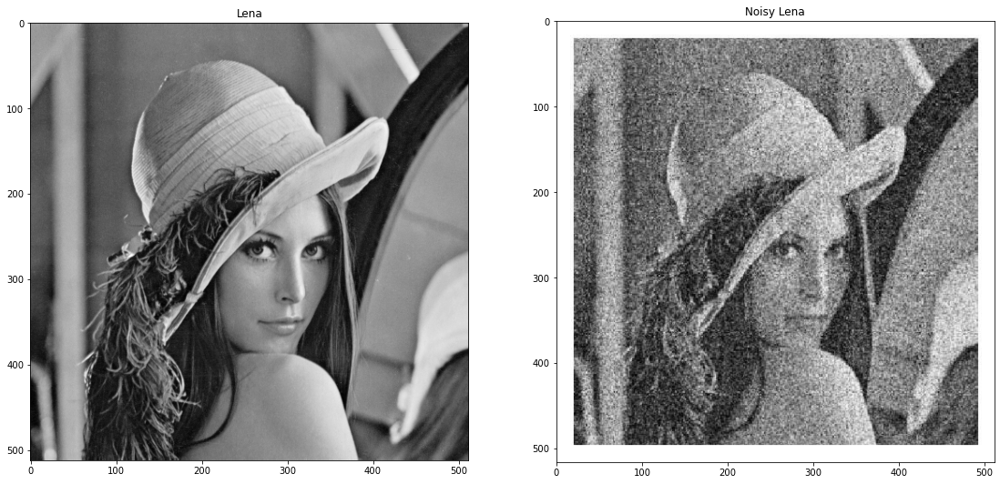

In [183]:
from PIL import Image
lena = np.array(Image.open('data/Lena.png').convert('L'))


noisyLena = np.array(Image.open('data/LenaNoisy.jpg').convert('L'))

plt.figure(dpi=200)
plt.figure(figsize=(50, 50), constrained_layout=False)
plt.subplot(151), plt.imshow(lena, "gray"), plt.title("Lena")
plt.subplot(152), plt.imshow(noisyLena, "gray"), plt.title("Noisy Lena")
plt.show()

### 2.1.1 Denoising - Part 1

In section 1 you defined several methods to apply filter to an image. Filters can be used to denoise an image. For example, you can use a mean filter by passing the following filter kernel to your method for the general filter calculation: <br>
<center>${g}_{mean}=\left(\begin{array}{ccc}\frac{1}{9} & \frac{1}{9} & \frac{1}{9}\\ \frac{1}{9} & \frac{1}{9} & \frac{1}{9}\\ \frac{1}{9} & \frac{1}{9} & \frac{1}{9}\end{array}\right)$</center>

Other filters are for example:<br>
<center>${g}_{box}=\left(\begin{array}{ccccc}0 & 0 & 0 & 0 & 0 \\ 0 & 1 & 1 & 1 & 0 \\ 0 & 1 & 1 & 1 & 0 \\ 0 & 1 & 1 & 1 & 0 \\ 0 & 0 & 0 & 0 & 0\end{array}\right)
{g}_{gaussian}=\left(\begin{array}{ccccc}0 & 1 & 2 & 1 & 0 \\ 1 & 3 & 5 & 3 & 1 \\ 2 & 5 & 9 & 5 & 2 \\ 1 & 3 & 5 & 3 & 1 \\ 0 & 1 & 2 & 1 & 0\end{array}\right)
{g}_{laPlace}=\left(\begin{array}{ccccc}0 & 0 & -1 & 0 & 0 \\ 0 & -1 & -2 & -1 & 0 \\ -1 & -2 & 16 & -2 & -1 \\ 0 & -1 & -2 & -1 & 0 \\ 0 & 0 & -1 & 0 & 0\end{array}\right)
{g}_{mexicanHat}=\left(\begin{array}{ccccccc}0&0&-1&-1&-1&0&0 \\ 0&-1&-3&-3&-3&-1&0 \\ -1&-3&0&7&0&-3&-1 \\ -1&-3&7&24&7&-3&-1 \\ -1&-3&0&7&0&-3&-1 \\ 0&-1&-3&-3&-3&-1&0 \\ 0&0&-1&-1&-1&0&0\end{array}\right)$</center>

**Apply these filters as well as the Median Filter and the Sigma Filter to the noisy image and see how they effect contrast and sharpness of the image! If possible, use different filter sizes!** 

In [184]:
meanFilter = np.array ([[1/9,1/9,1/9], 
                  [1/9,1/9,1/9],
                  [1/9,1/9,1/9]])

boxFilter = np.array([[0,0,0,0,0],
                      [0,1,1,1,0],
                      [0,1,1,1,0],
                      [0,1,1,1,0],
                      [0,0,0,0,0]])

gaussianFilter = np.array([[0,1,2,1,0],
                           [1,3,5,3,1],
                           [2,5,9,5,2],
                           [1,3,5,3,1],
                           [0,1,2,1,0]])

laplaceFilter = np.array([[0,0,-1,0,0],
                          [0,-1,-2,-1,0],
                          [-1,-2,16,-2,-1],
                          [0,-1,-2,-1,0],
                          [0,0,-1,0,0]])

mexicanHat = np.array([[0,0,-1,-1,-1,0,0],
                       [0,-1,-3,-3,-3,-1,0],
                       [-1,-3,0,7,0,-3,-1],
                       [-1,-3,7,24,7,-3,-1],
                       [-1,-3,0,7,0,-3,-1],
                       [0,-1,-3,-3,-3,-1,0],
                       [0,0,-1,-1,-1,0,0]])

hpFilter = np.array ([[-1/9,-1/9,-1/9], #High-Pass Filter
                      [-1/9,8/9,-1/9],
                      [-1/9,-1/9,-1/9]])  

In [185]:
noisyLenaMean = filtering(noisyLena, meanFilter)
noisyLenaBox = filtering(noisyLena,boxFilter)
noisyLenaGaussian = filtering(noisyLena,gaussianFilter)
noisyLenaLaPlace = filtering(noisyLena,laplaceFilter)
noisyLenaMexicanHat = filtering(noisyLena,mexicanHat)
noisyLenaHighPass = filtering(noisyLena,hpFilter)

<Figure size 1200x800 with 0 Axes>

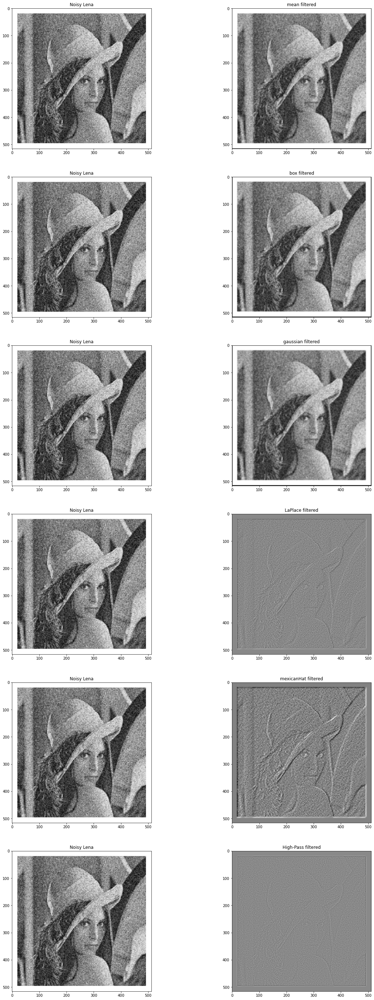

In [186]:
plt.figure(dpi=200)
plt.figure(figsize=(20, 50), constrained_layout=False)

plt.subplot2grid((6,2),(0,0)), plt.imshow(noisyLena, "gray"), plt.title("Noisy Lena")
plt.subplot2grid((6,2),(0,1)), plt.imshow(noisyLenaMean, "gray"), plt.title("mean filtered")

plt.subplot2grid((6,2),(1,0)), plt.imshow(noisyLena, "gray"), plt.title("Noisy Lena")
plt.subplot2grid((6,2),(1,1)), plt.imshow(noisyLenaBox, "gray"), plt.title("box filtered")

plt.subplot2grid((6,2),(2,0)), plt.imshow(noisyLena, "gray"), plt.title("Noisy Lena")
plt.subplot2grid((6,2),(2,1)), plt.imshow(noisyLenaGaussian, "gray"), plt.title("gaussian filtered")

plt.subplot2grid((6,2),(3,0)), plt.imshow(noisyLena, "gray"), plt.title("Noisy Lena")
plt.subplot2grid((6,2),(3,1)), plt.imshow(noisyLenaLaPlace, "gray"), plt.title("LaPlace filtered")

plt.subplot2grid((6,2),(4,0)), plt.imshow(noisyLena, "gray"), plt.title("Noisy Lena")
plt.subplot2grid((6,2),(4,1)), plt.imshow(noisyLenaMexicanHat, "gray"), plt.title("mexicanHat filtered")

plt.subplot2grid((6,2),(5,0)), plt.imshow(noisyLena, "gray"), plt.title("Noisy Lena")
plt.subplot2grid((6,2),(5,1)), plt.imshow(noisyLenaHighPass, "gray"), plt.title("High-Pass filtered")
plt.show()

In [187]:
noisyLenaMedian3 = medianFilter(noisyLena,3)
noisyLenaMedian5 = medianFilter(noisyLena,5)
noisyLenaMedian7 = medianFilter(noisyLena,7)

noisyLenaSigma3 = sigmaFilter(noisyLena,3)
noisyLenaSigma5 = sigmaFilter(noisyLena,5)
noisyLenaSigma7 = sigmaFilter(noisyLena,7)

<Figure size 1200x800 with 0 Axes>

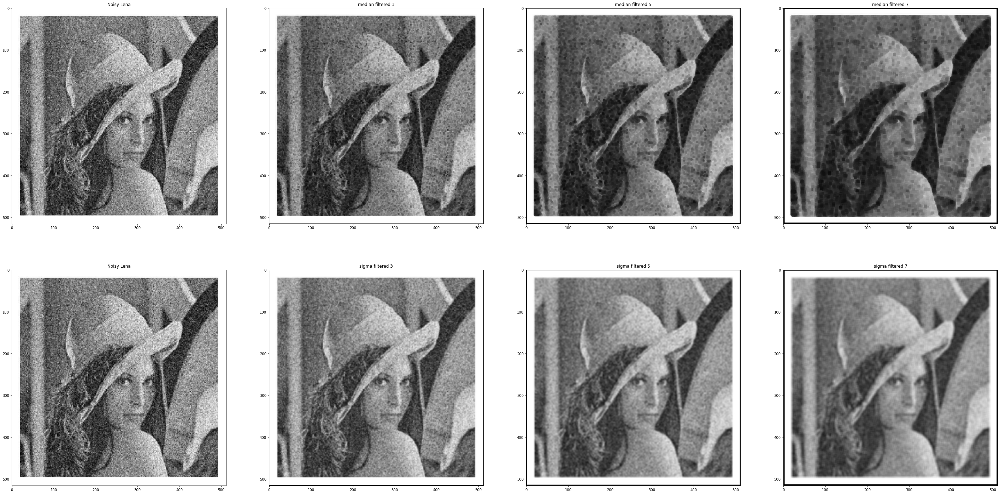

In [188]:
plt.figure(dpi=200)
plt.figure(figsize=(50, 25), constrained_layout=False)

plt.subplot(241), plt.imshow(noisyLena, "gray"), plt.title("Noisy Lena")
plt.subplot(242), plt.imshow(noisyLenaMedian3, "gray"), plt.title("median filtered 3")
plt.subplot(243), plt.imshow(noisyLenaMedian5, "gray"), plt.title("median filtered 5")
plt.subplot(244), plt.imshow(noisyLenaMedian7, "gray"), plt.title("median filtered 7")

plt.subplot(245), plt.imshow(noisyLena, "gray"), plt.title("Noisy Lena")
plt.subplot(246), plt.imshow(noisyLenaSigma3, "gray"), plt.title("sigma filtered 3")
plt.subplot(247), plt.imshow(noisyLenaSigma5, "gray"), plt.title("sigma filtered 5")
plt.subplot(248), plt.imshow(noisyLenaSigma7, "gray"), plt.title("sigma filtered 7")
plt.show()

### 2.1.2 Denoising - Part 2

**Add Salt and Pepper Noise** to the sample image without noise by applying the corresponding method (try $prob=0.005$). **Which filter is suited best to denoise Salt and Pepper Noise?**

In [189]:
spLena = addSaltAndPepperNoise(lena,0.005)

spLenaMean = filtering(spLena,meanFilter)
spLenaMedian = medianFilter(spLena,3)
spLenaSigma = sigmaFilter(spLena,3)

<Figure size 1200x800 with 0 Axes>

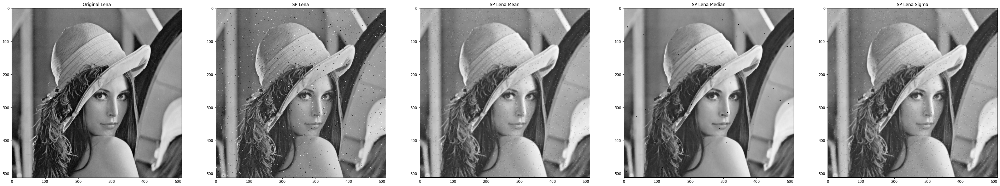

In [190]:
plt.figure(dpi=200)
plt.figure(figsize=(50, 50), constrained_layout=False)
plt.subplot(151), plt.imshow(lena, "gray"), plt.title("Original Lena")
plt.subplot(152), plt.imshow(spLena, "gray"), plt.title("SP Lena")
plt.subplot(153), plt.imshow(spLenaMean, "gray"), plt.title("SP Lena Mean")
plt.subplot(154), plt.imshow(spLenaMedian, "gray"), plt.title("SP Lena Median")
plt.subplot(155), plt.imshow(spLenaSigma, "gray"), plt.title("SP Lena Sigma")
plt.show()

**Try to enhance your image even more by applying a Low-, High- or Band-Pass Filter!**

In [191]:
spLenaHP = filtering(spLenaMedian, hpFilter)
spLenaGrad = gradient(spLenaMedian,spLenaHP)

<Figure size 1200x800 with 0 Axes>

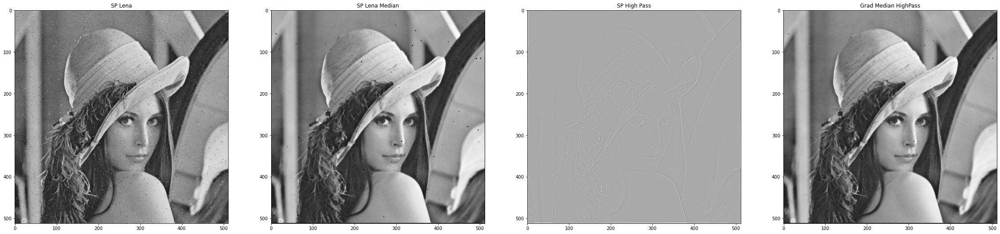

In [192]:
plt.figure(dpi=200)
plt.figure(figsize=(50, 50), constrained_layout=False)
plt.subplot(151), plt.imshow(spLena, "gray"), plt.title("SP Lena")
plt.subplot(152), plt.imshow(spLenaMedian, "gray"), plt.title("SP Lena Median")
plt.subplot(153), plt.imshow(spLenaHP, "gray"), plt.title("SP High Pass")
plt.subplot(154), plt.imshow(spLenaGrad, "gray"), plt.title("Grad Median HighPass")
plt.show()

### 2.2 Edge Detection

Apart from noise filtering, filters can also be used for edge detection. There are several filter kernel for edge detection. For example:<br>
<center>${g}_{x}=\left(\begin{array}{ccc}0 & 0 & 0\\ -1 & 1 & 0\\ 0 & 0 & 0\end{array}\right)$
${g}_{y}=\left(\begin{array}{ccc}0 & -1 & 0\\ 0 & 1 & 0\\ 0 & 0 & 0\end{array}\right)$</center>
<br>
Roberts Operator (no smoothing, sensitive to noise): <br>
<center>${g}_{1}=\left(\begin{array}{ccc}0 & -1 & 0\\ 1 & 0 & 0\\ 0 & 0 & 0\end{array}\right)$
${g}_{2}=\left(\begin{array}{ccc}-1 & 0 & 0\\ 0 & 1 & 0\\ 0 & 0 & 0\end{array}\right)$</center>
<br>
Prewitt Operator: <br>
<center>${g}_{x}=\left(\begin{array}{ccc}-1 & 0 & 1\\ -1 & 0 & 1\\ -1 & 0 & 1\end{array}\right)$
${g}_{y}=\left(\begin{array}{ccc}-1 & -1 & -1\\ 0 & 0 & 0\\ 1 & 1 & 1\end{array}\right)$</center>
<br>
Sobel Operator with weights: <br>
<center>${g}_{x}=\left(\begin{array}{ccc}-1 & 0 & 1\\ -2 & 0 & 2\\ -1 & 0 & 1\end{array}\right)$
${g}_{y}=\left(\begin{array}{ccc}-1 & -2 & -1\\ 0 & 0 & 0\\ 1 & 2 & 1\end{array}\right)$</center>
<br>
Prewitt and Sobel use neighboring pixels for smoothing.

Try to **detect edges** in the sample image without noise by using the different kernels. What differences do you see?

In [193]:
gx = np.array ([[0,0,0], [-1,1,0],[0,0,0]])  #edge detection
gy = np.array ([[0,-1,0], [0,1,0],[0,0,0]])

g1 = np.array ([[0,-1,0], [1,0,0],[0,0,0]])  #roberts operator
g2 = np.array ([[-1,0,0], [1,0,0],[0,0,0]])

gxPr = np.array ([[-1,0,1], [-1,0,1], [-1,0,1]])  #Prewitt operator
gyPr = np.array ([[-1,-1,-1], [0,0,0], [1,1,1]])

gxSo = np.array ([[-1,0,1], [-2,0,2], [-1,0,1]])  #Sobel operator
gySo = np.array ([[-1,-2,-1], [0,0,0], [1,2,1]])

In [194]:
lenaEdgeX = filtering(lena,gx)
lenaEdgeY = filtering(lena,gy)

lenaRob1 = filtering(lena,g1)
lenaRob2 = filtering(lena,g2)

lenaPreX = filtering(lena,gxPr)
lenaPreY = filtering(lena,gyPr)

lenaSobX = filtering(lena,gxSo)
lenaSobY = filtering(lena,gySo)

**Combine the x and y filtered images** by calculating the Gradient image as follows. Write yourself a method for this.<br>
### <center>$G=\sqrt{{{G}_{x}}^{2} + {{G}_{y}}^{2}}$</center>

In [195]:
def gradient(image1, image2):
    
    result = np.zeros(image1.shape, dtype=np.float)
    max = 0
    
    for x in range(image1.shape[0]):
        for y in range(image1.shape[1]):
            result[x,y]=sqrt((image1[x,y]*image1[x,y] + image2[x,y]*image2[x,y]))
            if result[x,y]>max:
                max = result[x,y]
                
    factor = 255/max
    
    for x in range(image1.shape[0]):
        for y in range(image1.shape[1]):
            result[x,y] = result[x,y]*factor
    return result

In [196]:
lenaEdgeGrad = gradient(lenaEdgeX,lenaEdgeY)
lenaRobGrad = gradient(lenaRob1,lenaRob2)
lenaPrewittGrad = gradient(lenaPreX,lenaPreY)
lenaSobelGrad = gradient(lenaSobX,lenaSobY)

<Figure size 1200x800 with 0 Axes>

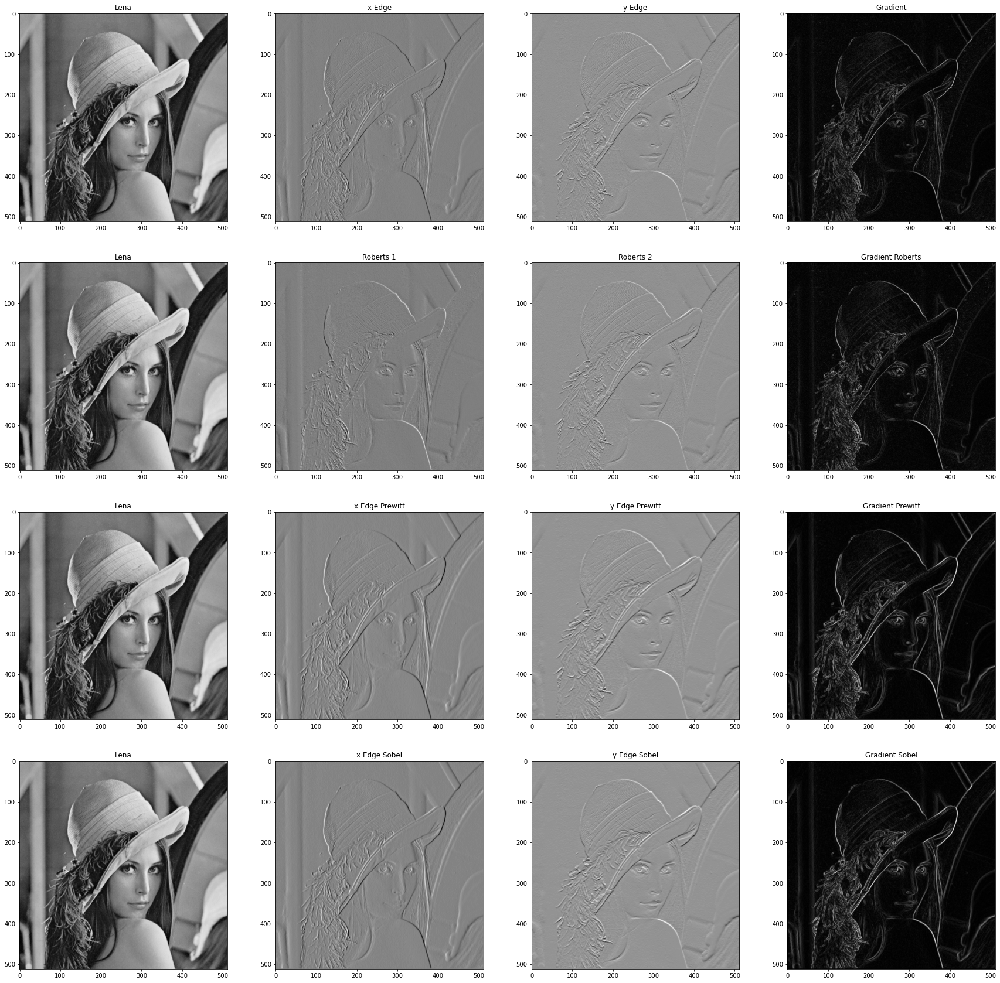

In [197]:
plt.figure(dpi=200)
plt.figure(figsize=(30, 30), constrained_layout=False)

plt.subplot2grid((4,4),(0,0)), plt.imshow(lena, "gray"), plt.title("Lena")
plt.subplot2grid((4,4),(0,1)), plt.imshow(lenaEdgeX, "gray"), plt.title("x Edge")
plt.subplot2grid((4,4),(0,2)), plt.imshow(lenaEdgeY, "gray"), plt.title("y Edge")
plt.subplot2grid((4,4),(0,3)), plt.imshow(lenaEdgeGrad, "gray"), plt.title("Gradient")

plt.subplot2grid((4,4),(1,0)), plt.imshow(lena, "gray"), plt.title("Lena")
plt.subplot2grid((4,4),(1,1)), plt.imshow(lenaRob1, "gray"), plt.title("Roberts 1")
plt.subplot2grid((4,4),(1,2)), plt.imshow(lenaRob2, "gray"), plt.title("Roberts 2")
plt.subplot2grid((4,4),(1,3)), plt.imshow(lenaRobGrad, "gray"), plt.title("Gradient Roberts")

plt.subplot2grid((4,4),(2,0)), plt.imshow(lena, "gray"), plt.title("Lena")
plt.subplot2grid((4,4),(2,1)), plt.imshow(lenaPreX, "gray"), plt.title("x Edge Prewitt")
plt.subplot2grid((4,4),(2,2)), plt.imshow(lenaPreY, "gray"), plt.title("y Edge Prewitt")
plt.subplot2grid((4,4),(2,3)), plt.imshow(lenaPrewittGrad, "gray"), plt.title("Gradient Prewitt")

plt.subplot2grid((4,4),(3,0)), plt.imshow(lena, "gray"), plt.title("Lena")
plt.subplot2grid((4,4),(3,1)), plt.imshow(lenaSobX, "gray"), plt.title("x Edge Sobel")
plt.subplot2grid((4,4),(3,2)), plt.imshow(lenaSobY, "gray"), plt.title("y Edge Sobel")
plt.subplot2grid((4,4),(3,3)), plt.imshow(lenaSobelGrad, "gray"), plt.title("Gradient Sobel")

plt.show()

### 2.3 Edge Detection in Noisy Images

**Apply the** previously used **filters to the noisy sample image**. What **problems** do you have to deal with?

In [198]:
noisyLenaSobX = filtering(noisyLena,gxSo)
noisyLenaSobY = filtering(noisyLena,gySo)
noisyLenaSobelGrad = gradient(noisyLenaSobX,noisyLenaSobY)

Sometimes it makes sense to smooth noisy images before you can detect edges. For example, you can apply the Mean Filter or a Gaussian Blur Filter (e.g. ```import cv2, cv2.GaussianBlur(image,(5,5),0)```) to the noisy image. **Now first smooth the image before trying to detect the edges.**

In [199]:
noisyLenaBlurred = cv2.GaussianBlur(noisyLena,(5,5),0)
noisyLenaBlurredSobX = filtering(noisyLenaBlurred,gxSo)
noisyLenaBlurredSobY = filtering(noisyLenaBlurred,gySo)
noisyLenaBlurredSobelGrad = gradient(noisyLenaBlurredSobX,noisyLenaBlurredSobY)

<Figure size 1200x800 with 0 Axes>

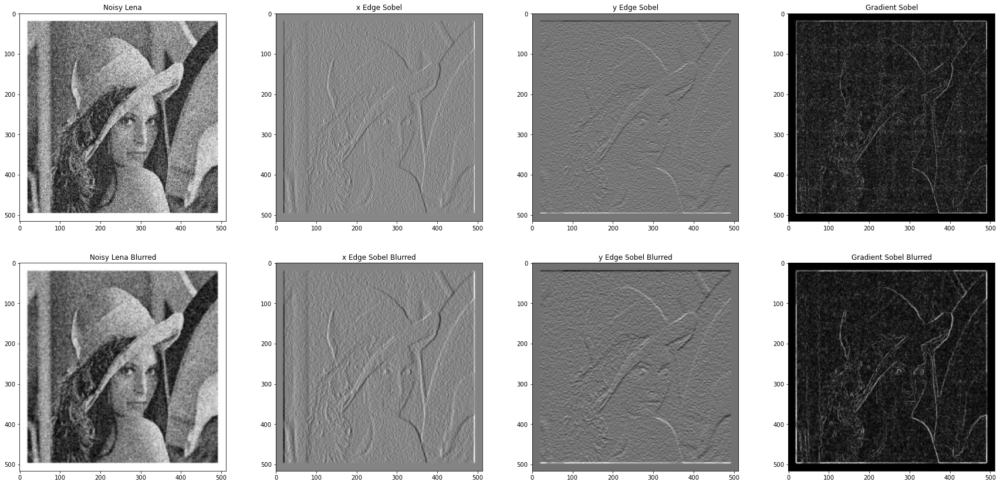

In [200]:
plt.figure(dpi=200)
plt.figure(figsize=(30, 30), constrained_layout=False)

plt.subplot2grid((4,4),(0,0)), plt.imshow(noisyLena, "gray"), plt.title("Noisy Lena")
plt.subplot2grid((4,4),(0,1)), plt.imshow(noisyLenaSobX, "gray"), plt.title("x Edge Sobel")
plt.subplot2grid((4,4),(0,2)), plt.imshow(noisyLenaSobY, "gray"), plt.title("y Edge Sobel")
plt.subplot2grid((4,4),(0,3)), plt.imshow(noisyLenaSobelGrad, "gray"), plt.title("Gradient Sobel")

plt.subplot2grid((4,4),(1,0)), plt.imshow(noisyLenaBlurred, "gray"), plt.title("Noisy Lena Blurred")
plt.subplot2grid((4,4),(1,1)), plt.imshow(noisyLenaBlurredSobX, "gray"), plt.title("x Edge Sobel Blurred")
plt.subplot2grid((4,4),(1,2)), plt.imshow(noisyLenaBlurredSobY, "gray"), plt.title("y Edge Sobel Blurred")
plt.subplot2grid((4,4),(1,3)), plt.imshow(noisyLenaBlurredSobelGrad, "gray"), plt.title("Gradient Sobel Blurred")

plt.show()

In [178]:
def minMaxScaling(image):
    xDim=image.shape[0]
    yDim=image.shape[1]
    result = np.zeros(shape=[xDim,yDim], dtype=np.float)
    min=256
    max=0
    
    for x in range(image.shape[0]):
        for y in range(image.shape[1]):
            
            
            if image[x,y]>max:
                max = image[x,y]
            if image[x,y]<min:
                min = image[x,y]
                
    #factor = 256/max
    print("max:", max)
    print("min:", min)
    #print(factor)
    
    #for x in range(xDim):
      #  for y in range(yDim):
          #  result[x,y] = result[x,y]*factor
            
    return image